## Paso 1: Configuración del Entorno

Antes de comenzar, se instalan las librerías necesarias. Se uso para instalarlas pip.

```bash
pip install pandas numpy matplotlib
```

## Paso 2: Importar Librerías y Cargar Datos

Primero, importamos las librerías necesarias y cargamos el conjunto de datos del archivo CSV.

In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Configuración para gráficos interactivos en Jupyter Notebook
%matplotlib inline

# Cargar el conjunto de datos
try:
    df = pd.read_csv('Datos.csv', encoding='utf-8')
    print("Archivo CSV cargado exitosamente.")
except FileNotFoundError:
    print("El archivo 'datos.csv' no fue encontrado.")


Archivo CSV cargado exitosamente.


## Paso 3: Exploración Inicial de los Datos

Es importante entender la estructura de los datos antes de proceder con la limpieza y el análisis.


In [78]:
# Mostrar las primeras filas del DataFrame
display(df.head())

# Obtener información general del DataFrame
print(df.info())

# Resumen estadístico de las columnas numéricas
print(df.describe())

# Verificar las columnas y tipos de datos
print(df.columns)


,Course Title,Rating,Level,Duration,Schedule,Review,What you will learn,Skill gain,Modules,Instructor,Offered By,Keyword,Course Url
0,Fashion as Design,4.8,Beginner level,20 hours (approximately),Flexible schedule,"2,813 reviews",NaN,"['Art History', 'Art', 'History', 'Creativity']","['Introduction', 'Heroes', 'Silhouettes', 'Cou...","['Anna Burckhardt', 'Paola Antonelli', 'Michel...",['The Museum of Modern Art'],Arts and Humanities,https://www.coursera.org/learn/fashion-design
1,Modern American Poetry,4.4,Beginner level,Approx. 34 hours to complete,Flexible schedule,100 reviews,NaN,[],"['Orientation', 'Module 1', 'Module 2', 'Modul...",['Cary Nelson'],['University of Illinois at Urbana-Champaign'],Arts and Humanities,https://www.coursera.org/learn/modern-american...
2,Pixel Art for Video Games,4.5,Beginner level,9 hours (approximately),Flexible schedule,227 reviews,NaN,[],"['Week 1: Introduction to Pixel Art', 'Week 2:...","['Andrew Dennis', 'Ricardo Guimaraes']",['Michigan State University'],Arts and Humanities,https://www.coursera.org/learn/pixel-art-video...
3,Distribución digital de la música independiente,NaN,Beginner level,Approx. 8 hours to complete,Flexible schedule,NaN,NaN,[],"['Semana 1', 'Semana 2', 'Semana 3', 'Semana 4']",['Eduardo de la Vara Brown.'],['SAE Institute México'],Arts and Humanities,https://www.coursera.org/learn/distribucion-di...
4,The Blues: Understanding and Performing an Ame...,4.8,Beginner level,Approx. 11 hours to complete,Flexible schedule,582 reviews,Students will be able to describe the blues as...,"['Music', 'Chord', 'Jazz', 'Jazz Improvisation']","['Blues Progressions – Theory and Practice ', ...",['Dariusz Terefenko'],['University of Rochester'],Arts and Humanities,https://www.coursera.org/learn/the-blues


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9595 entries, 0 to 9594
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Course Title         9595 non-null   object 
 1   Rating               8156 non-null   float64
 2   Level                8330 non-null   object 
 3   Duration             9333 non-null   object 
 4   Schedule             8912 non-null   object 
 5   Review               8152 non-null   object 
 6   What you will learn  4984 non-null   object 
 7   Skill gain           9595 non-null   object 
 8   Modules              9595 non-null   object 
 9   Instructor           9595 non-null   object 
 10  Offered By           9595 non-null   object 
 11  Keyword              9595 non-null   object 
 12  Course Url           9595 non-null   object 
dtypes: float64(1), object(12)
memory usage: 974.6+ KB
None
            Rating
count  8156.000000
mean      4.651533
std       0.240674
min    

## Paso 4: Limpieza de Datos

La limpieza de datos es crucial para asegurar la calidad del análisis. Para este caso se eliminaron las filas que tenian los siguientes campos nulos:
- 'Course Title'
- 'Level'
- 'Schedule'

Y los siguientes campos se rellanaron en caso tuvieran valores nulos:
- 'Rating': 0,                        
- 'Duration': '0 hours (approximately)',  
- 'Review': '0 reviews',              
- 'What you will learn': '',          
- 'Skill gain': '[]',                 
- 'Modules': '[]',                    
- 'Instructor': '[]',                 
- 'Keyword': '[]',                    
- 'Course Url': ''                    

In [79]:
# Verificar la cantidad de valores nulos por columna
print(df.isnull().sum())

# 1. Eliminar filas con valores nulos
df_cleaned = df.dropna(subset=['Course Title', 'Level', 'Schedule']).copy()

df_cleaned.fillna({
    'Rating': 0,                        # Rellenar 'Rating' con 0
    'Duration': '0 hours (approximately)',  # Rellenar 'Duration' con '0 hours (approximately)'
    'Review': '0 reviews',              # Rellenar 'Review' con '0 reviews'
    'What you will learn': '',          # Rellenar 'What you will learn' con una cadena vacía
    'Skill gain': '[]',                 # Rellenar 'Skill gain' con una lista vacía
    'Modules': '[]',                    # Rellenar 'Modules' con una lista vacía
    'Instructor': '[]',                 # Rellenar 'Instructor' con una lista vacía
    'Keyword': '[]',                    # Rellenar 'Keyword' con una lista vacía
    'Course Url': ''                    # Rellenar 'Course Url' con una cadena vacía
}, inplace=True)


Course Title              0
Rating                 1439
Level                  1265
Duration                262
Schedule                683
Review                 1443
What you will learn    4611
Skill gain                0
Modules                   0
Instructor                0
Offered By                0
Keyword                   0
Course Url                0
dtype: int64


## 4.2. Corrección de Tipos de Datos

En este paso se realizo la transformación de ciertas columnas para que luego hacer las manipulaciones necesarias con dichas columnas.

In [80]:
import re

def extract_hours(duration):
    match = re.search(r'(\d+)', duration)  # Buscar solo el número en la duración
    return int(match.group(1)) if match else 0

df_cleaned['Duration'] = df_cleaned['Duration'].apply(extract_hours)

def extract_reviews(review):
    match = re.search(r'(\d+)', review)  # Buscar solo el número en las revisiones
    return int(match.group(1)) if match else 0

df_cleaned['Review'] = df_cleaned['Review'].apply(extract_reviews)

df_cleaned['Rating'] = pd.to_numeric(df_cleaned['Rating'], errors='coerce')

# Crear una nueva columna 'horario_flexible' basada en 'Schedule'
df_cleaned['horario_flexible'] = df_cleaned['Schedule'].str.contains('Flexible', case=False, na=False)


## 4.3. Eliminación de Duplicados

Eliminar registros duplicados para evitar sesgos en el análisis.

In [81]:
# Eliminar filas duplicadas
df_cleaned = df_cleaned.drop_duplicates()

# Verificar si hay duplicados restantes
print(df_cleaned.duplicated().sum())

# Eliminar filas duplicadas basadas en 'Course Title'
df_cleaned = df_cleaned.drop_duplicates(subset='Course Title')

# Verificar si hay duplicados restantes
print(df_cleaned.duplicated(subset='Course Title').sum())


0
0


# Paso 5: Análisis de Datos

Ahora que los datos están limpios, procederemos con los análisis solicitados.

## 5.1. Cálculo del Promedio de Calificaciones por Curso

Agruparemos los datos por el título del curso y calcularemos el promedio de las calificaciones.

## Analisis

Podemos notar que la calificación promedio mas alta es de 4.8 mientras que la mas baja es de 0

In [82]:
# Agrupar por 'Course Title' y calcular el promedio de 'Rating'
promedio_calificaciones = df_cleaned.groupby('Course Title')['Rating'].mean().reset_index()

# Renombrar la columna para mayor claridad
promedio_calificaciones.rename(columns={'Rating': 'promedio_calificaciones'}, inplace=True)

print(promedio_calificaciones.head())

                                        Course Title  promedio_calificaciones
0   Assisting Public Sector Decision Makers With ...                      4.8
1   Atención prehospitalaria del ictus agudo y se...                      4.9
2   Comercio, Inmigración y Tipos de Cambio en un...                      4.9
3   FPGA computing systems: Background knowledge ...                      4.6
4           Fundamentals of Business Problem Solving                      0.0


## 5.2. Identificar Cursos con Mayor y Menor Rating

Encontraremos los cursos con el rating más alto y más bajo.

## Analisis

El curso con mayor rating fue un curso con un titulo chino con 5, mientras que el de menor fue Fundamentals of Business Problem Solving con 0.

In [83]:
# Curso con mayor rating
curso_mayor_rating = promedio_calificaciones.loc[promedio_calificaciones['promedio_calificaciones'].idxmax()]
print("Curso con mayor rating:")
print(curso_mayor_rating)

# Curso con menor rating
curso_menor_rating = promedio_calificaciones.loc[promedio_calificaciones['promedio_calificaciones'].idxmin()]
print("\nCurso con menor rating:")
print(curso_menor_rating)


Curso con mayor rating:
Course Title                التنسيق في مايكروسوفت إكسل | Formatting in MS...
promedio_calificaciones                                                  5.0
Name: 31, dtype: object

Curso con menor rating:
Course Title                Fundamentals of Business Problem Solving
promedio_calificaciones                                          0.0
Name: 4, dtype: object


## 5.3. Cálculo del Porcentaje de Cursos con Horario Flexible

Calculamos el porcentaje de cursos que ofrecen horario flexible respecto al total de cursos.

## Análisis

Podemos notar que el 100% de los cursos cuentan con un horario flexible.

In [84]:
# Calcular el número total de cursos
total_cursos = len(df_cleaned)

# Calcular el número de cursos con horario flexible
cursos_flexibles = df_cleaned['horario_flexible'].sum()

# Calcular el porcentaje
porcentaje_flexible = (cursos_flexibles / total_cursos) * 100

# Redondear a dos decimales
porcentaje_flexible = round(porcentaje_flexible, 2)

print(f"Porcentaje de cursos con horario flexible: {porcentaje_flexible}%")


Porcentaje de cursos con horario flexible: 100.0%


# Preparación Inicial

Primero, instalamos las librerías necesarias:

```bash
pip install nltk
```

Luego, importamos los paquetes requeridos:

In [85]:

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.probability import FreqDist
from nltk import ne_chunk, pos_tag
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import string

# Descargar recursos de NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('words')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hugom\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hugom\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hugom\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\hugom\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\hugom\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\hugom\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-

True

# Cargamos el archivo .txt

In [86]:

with open('Coursera Comments.txt', 'r', encoding='utf-8') as file:
    text = file.read()

## 1. Tokenización

La tokenización es el proceso de dividir un texto en palabras o frases más pequeñas (tokens).

In [87]:

# Tokenización de palabras
tokens_palabras = word_tokenize(text)

# Tokenización de oraciones
tokens_oraciones = sent_tokenize(text)

print(f"Tokens de palabras: {tokens_palabras[:10]}")  # Muestra las primeras 10 palabras
print(f"Tokens de oraciones: {tokens_oraciones[:3]}")  # Muestra las primeras 3 oraciones


Tokens de palabras: ['Abril', 'Vargas', 'Pérez', '3', 'opiniones', 'PT', 'Valorada', 'con', '5', 'estrellas']
Tokens de oraciones: ['\nAbril Vargas Pérez\n3 opiniones\nPT\nValorada con 5 estrellas sobre 5\n21 ago 2024\nEscandalizada y confundida por las…\nEscandalizada y confundida por las malas reseñas.', 'Estoy en coursera desde el mes de julio 2024 y estoy haciendo actualmente el curso de front-end developer que imparte Meta.', 'Para entrar a este curso tenías que pagar Coursera Plus, donde tienes acceso a todos los cursos por 45 euros mensuales.']


## 2. Lematización y Stemming

La lematización convierte una palabra a su forma base (lemmatization), mientras que el stemming recorta las palabras a sus raíces.

### Lematización

In [88]:

lemmatizer = WordNetLemmatizer()
lematized_words = [lemmatizer.lemmatize(token) for token in tokens_palabras]

print(f"Palabras lematizadas: {lematized_words[:10]}")  # Muestra las primeras 10 palabras lematizadas


Palabras lematizadas: ['Abril', 'Vargas', 'Pérez', '3', 'opiniones', 'PT', 'Valorada', 'con', '5', 'estrellas']


### Stemming

In [89]:

stemmer = PorterStemmer()
stemmed_words = [stemmer.stem(token) for token in tokens_palabras]

print(f"Palabras con stemming: {stemmed_words[:10]}")  # Muestra las primeras 10 palabras con stemming

Palabras con stemming: ['abril', 'varga', 'pérez', '3', 'opinion', 'pt', 'valorada', 'con', '5', 'estrella']


## 3. Eliminación de Palabras Vacías (Stop Words)

Las palabras vacías son aquellas que no tienen mucho significado (por ejemplo, "el", "la", "en").

In [91]:

# Cargar stopwords en español e inglés (puedes ajustar según tu archivo)
stop_words = set(stopwords.words('english')).union(set(stopwords.words('spanish')))

# Eliminar palabras vacías y signos de puntuación
filtered_words = [word for word in tokens_palabras if word.lower() not in stop_words and word not in string.punctuation]

print(f"Palabras filtradas (sin stopwords): {filtered_words[:10]}")  # Muestra las primeras 10 palabras filtradas

# Supongamos que tokens_palabras es tu lista original de palabras
total_palabras = len(tokens_palabras)
total_filtradas = len(filtered_words)

# Calcular cuántas palabras fueron eliminadas
palabras_eliminadas = total_palabras - total_filtradas

print(f"Total de palabras originales: {total_palabras}")
print(f"Total de palabras filtradas: {total_filtradas}")
print(f"Palabras eliminadas (stopwords y puntuación): {palabras_eliminadas}")



Palabras filtradas (sin stopwords): ['Abril', 'Vargas', 'Pérez', '3', 'opiniones', 'PT', 'Valorada', '5', 'estrellas', '5']
Total de palabras originales: 204876
Total de palabras filtradas: 101123
Palabras eliminadas (stopwords y puntuación): 103753


## 4. Frecuencia de Palabras

Contamos la frecuencia de cada palabra en el texto, excluyendo las palabras vacías.

In [92]:
# Calcular frecuencia de palabras
fdist = FreqDist(filtered_words)
print("Frecuencia de palabras:", fdist.most_common(10))


Frecuencia de palabras: [('curso', 1297), ('“', 869), ('”', 869), ('Semana', 843), ('TA', 835), ('participantes', 822), ('semana', 780), ('dudas', 744), ('portafolio', 731), ('1', 569)]


## 5. Análisis de Sentimientos

El análisis de sentimientos identifica si el tono de un texto es positivo, negativo o neutral.

In [93]:

# Inicializar el analizador de sentimientos
sia = SentimentIntensityAnalyzer()

# Analizar sentimiento del texto
sentiment = sia.polarity_scores(text)
print("Análisis de sentimientos:", sentiment)
for sentence in tokens_oraciones:
    sentiment = sia.polarity_scores(sentence)
    print(f"Análisis de sentimientos para: {sentence}")
    print(f"Análisis de sentimientos para: {sentiment}")
    print(f"-----------------------------------------------------")


Análisis de sentimientos: {'neg': 0.035, 'neu': 0.954, 'pos': 0.011, 'compound': -1.0}
Análisis de sentimientos para: 
Abril Vargas Pérez
3 opiniones
PT
Valorada con 5 estrellas sobre 5
21 ago 2024
Escandalizada y confundida por las…
Escandalizada y confundida por las malas reseñas.
Análisis de sentimientos para: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
-----------------------------------------------------
Análisis de sentimientos para: Estoy en coursera desde el mes de julio 2024 y estoy haciendo actualmente el curso de front-end developer que imparte Meta.
Análisis de sentimientos para: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
-----------------------------------------------------
Análisis de sentimientos para: Para entrar a este curso tenías que pagar Coursera Plus, donde tienes acceso a todos los cursos por 45 euros mensuales.
Análisis de sentimientos para: {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
-----------------------------------------------

## 6. Reconocimiento de Entidades Nombradas (NER)

Las entidades nombradas son elementos específicos como nombres de personas, organizaciones o lugares.

In [94]:
# Etiquetado de partes del discurso (POS tagging)
pos_tags = pos_tag(tokens_palabras)

# Reconocimiento de entidades nombradas
named_entities = ne_chunk(pos_tags)
print(named_entities)


(S
  (PERSON Abril/NNP)
  (PERSON Vargas/NNP Pérez/NNP)
  3/CD
  opiniones/NNS
  (ORGANIZATION PT/NNP Valorada/NNP)
  con/VBD
  5/CD
  estrellas/NNS
  sobre/VBD
  5/CD
  21/CD
  ago/RB
  2024/CD
  Escandalizada/NNP
  y/CC
  confundida/JJ
  por/NN
  las…/NN
  (PERSON Escandalizada/NNP)
  y/NNP
  confundida/NN
  por/NN
  las/VBZ
  malas/NNS
  reseñas/NN
  ./.
  (PERSON Estoy/NNP)
  en/IN
  coursera/NN
  desde/NN
  el/JJ
  mes/NNS
  de/IN
  julio/NN
  2024/CD
  y/NN
  estoy/CC
  haciendo/NN
  actualmente/NN
  el/FW
  curso/NN
  de/IN
  front-end/JJ
  developer/NN
  que/NN
  imparte/NN
  (ORGANIZATION Meta/NNP)
  ./.
  (PERSON Para/NNP)
  entrar/VBD
  a/DT
  este/NN
  curso/NN
  tenías/NN
  que/NN
  pagar/NN
  (PERSON Coursera/NNP Plus/NNP)
  ,/,
  donde/NN
  tienes/NNS
  acceso/VBP
  a/DT
  todos/JJ
  los/NN
  cursos/NN
  por/NN
  45/CD
  euros/NN
  mensuales/NNS
  ./.
  (PERSON Duré/NNP)
  en/IN
  un/JJ
  periodo/NN
  de/IN
  prueba/FW
  gratis/NN
  de/IN
  7/CD
  días/NNS
  y/RB
  al/VB

## 7. Extracción de Entidades

Extraer entidades específicas, como personas, lugares, o organizaciones.

In [95]:
# Extraer entidades (ejemplo simple)
entities = []
for chunk in named_entities:
    if hasattr(chunk, 'label'):
        entities.append(' '.join(c[0] for c in chunk))
        
print("Entidades nombradas:", entities)
print(named_entities)



Entidades nombradas: ['Abril', 'Vargas Pérez', 'PT Valorada', 'Escandalizada', 'Estoy', 'Meta', 'Para', 'Coursera Plus', 'Duré', 'Quizás', 'Valorada', 'Fecha', 'Valorada', 'Fecha', 'Valorada', 'ESTAFADORES', 'Fecha', 'ES Valorada', 'ESTAFADORES', 'ESTAFADORES', 'Mismo', 'Fecha', 'Maria Eugenia Simancas Soriano', 'US Valorada', 'Cuidado', 'Son', 'Además', 'Fecha', 'US Valorada', 'Creo', 'Courser Learner', 'Curso', 'Universidad', 'Fecha', 'Valorada', 'Leí', 'Coursera', 'Fecha', 'Jeanpierre Nuñez', 'Valorada', 'Microsoft', 'Ya', 'Porqueria', 'Fecha', 'Cristian', 'Valorada', 'Realmente', 'Pésimo', 'Fecha', 'Determina', 'Maha Visnu Da Silva', 'CL Valorada', 'Fecha', 'ES Valorada', 'Fecha', 'Andres Hidalgo', 'Valorada', 'Estaba', 'Estaba', 'Introducción', 'CyberSeguridad', 'Fecha', 'Sam Solìs', 'Valorada', 'Universidad', 'Virginia', 'Universidad', 'Fecha', 'Valorada', 'Estaba', 'Todo', 'Fecha', 'Valorada', 'Cuando', 'Fecha', 'Sergio Rey', 'Valorada', 'Además', 'Fecha', 'Valorada', 'Los', 'Lo

# Gráfica de barras

Muestra el número de cursos en cada nivel de dificultad.

## Analisis

Obtuvimos un total de 3320 curso en nivel Principiante, 1431 cursos en nivel intermedio y 179 cursos en nivel avanzado, estos cursos fueron obtenidos a partir de los datos ya procesados y limpios.

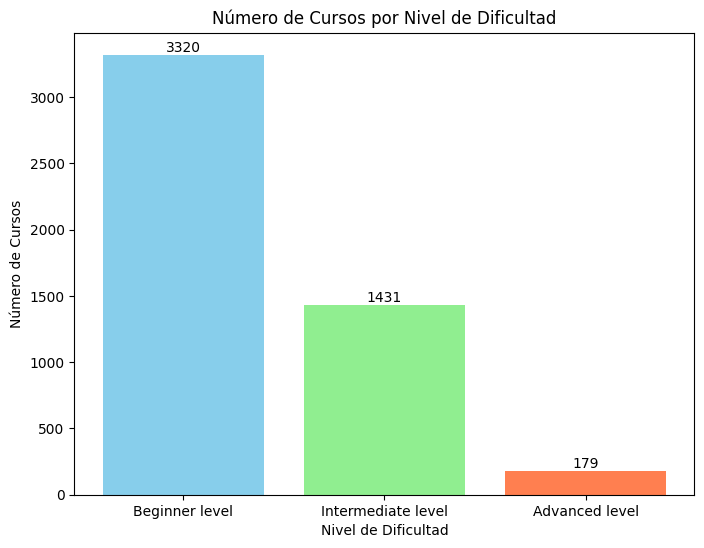

In [96]:
# Contar el número de cursos por nivel de dificultad
course_count_by_level = df_cleaned['Level'].value_counts()

# # Crear la gráfica de barras con diferentes colores
colors = ['skyblue', 'lightgreen', 'coral', 'orange', 'purple']  # Puedes añadir más colores si hay más niveles
plt.figure(figsize=(8, 6))
bars = plt.bar(course_count_by_level.index, course_count_by_level.values, color=colors[:len(course_count_by_level)])

# Añadir la cantidad de cursos encima de cada barra
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Configurar títulos y etiquetas
plt.title('Número de Cursos por Nivel de Dificultad')
plt.xlabel('Nivel de Dificultad')
plt.ylabel('Número de Cursos')

# Mostrar la gráfica
plt.show()

# Gráfica de barras horizontal

Muestra el número de cursos en las principales categorías, necesitamos contar cuántos cursos pertenecen a cada categoría (utilizando la columna Keyword)

## Analisis

Para este grafico se hizo unicamente un top 10, las categorias que se obtuvieron fueron: 
- Computer Science (837)
- Business (740)
- Health (669)

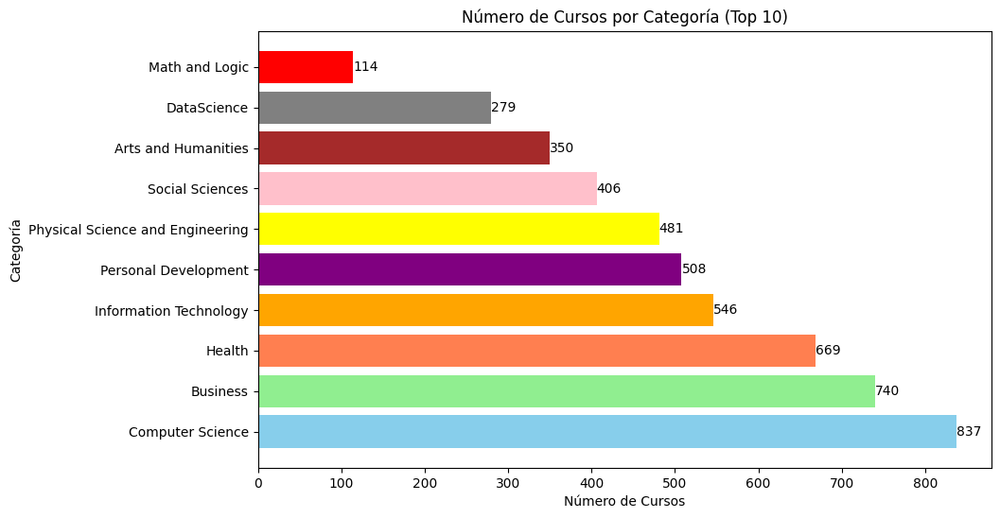

In [97]:
# 3. Contar el número de cursos por categoría (usando la columna 'Keyword' como categoría)
category_count = df_cleaned['Keyword'].value_counts().head(10)  # Mostrar solo las 10 categorías principales

# 4. Lista de colores para cada barra
colors = ['skyblue', 'lightgreen', 'coral', 'orange', 'purple', 'yellow', 'pink', 'brown', 'gray', 'red']

# 5. Crear la gráfica de barras horizontal con diferentes colores
plt.figure(figsize=(10, 6))
bars = plt.barh(category_count.index, category_count.values, color=colors[:len(category_count)])

# 6. Añadir la cantidad de cursos al final de cada barra
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, int(bar.get_width()), va='center')

# 7. Configurar títulos y etiquetas
plt.title('Número de Cursos por Categoría (Top 10)')
plt.xlabel('Número de Cursos')
plt.ylabel('Categoría')

# 8. Mostrar la gráfica
plt.show()

# Gráfico de dispersión

Muestra la relación entre la duración del curso y el número de revisiones, se trabajo con los campos de Duration y Review previamente limpiados.

## Analisis

Se logra apreciar de forma grafica la relacion entre la duracion del curso y el numero de revisiones, de esta forma se logra observar el comportamiento.

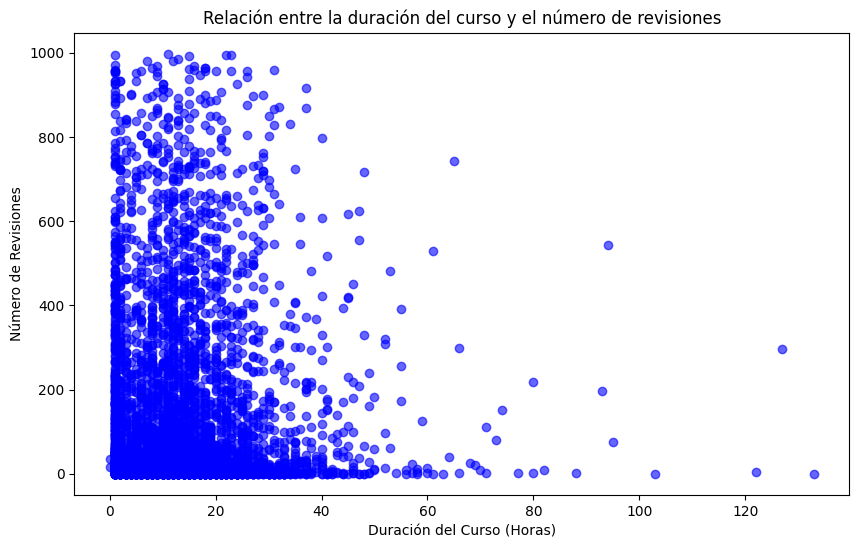

In [98]:
# 5. Crear el gráfico de dispersión
plt.figure(figsize=(10, 6))

# Crear gráfico de dispersión entre la duración y el número de revisiones
plt.scatter(df_cleaned['Duration'], df_cleaned['Review'], color='blue', alpha=0.6)

# Añadir títulos y etiquetas
plt.title('Relación entre la duración del curso y el número de revisiones')
plt.xlabel('Duración del Curso (Horas)')
plt.ylabel('Número de Revisiones')

# Mostrar la gráfica
plt.show()

# Histograma

Muestra la distribución de las duraciones de los cursos, se utilizó la columna de Duration, que previamente limpiamos para convertirla a valores numéricos (en horas).

## Analisis

La duración del curso de 10 horas fue el que más se repite y luego el de 20 horas. Con esto evaluamos que la mayoria de cursos dura alrededor de 10 horas aproximadamente.

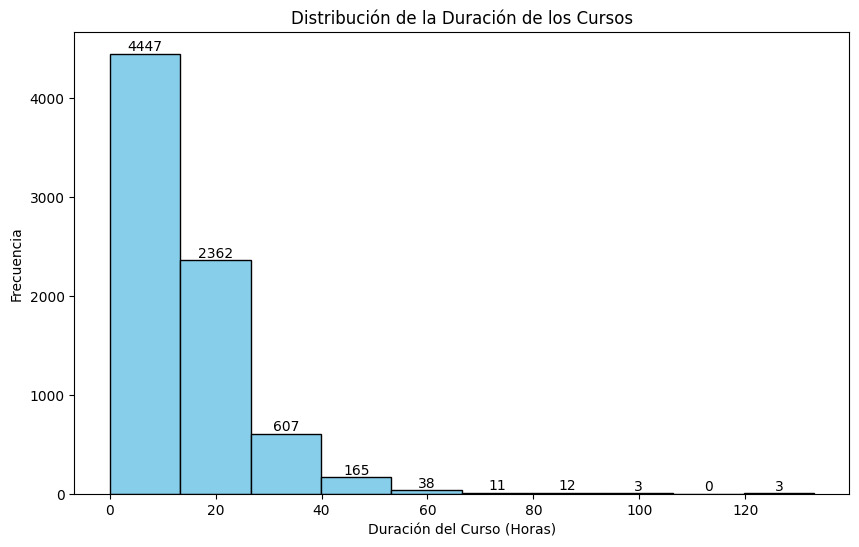

In [32]:
# 4. Crear el histograma de la distribución de las duraciones de los cursos
plt.figure(figsize=(10, 6))

# Crear el histograma y obtener los valores de las barras
counts, bins, patches = plt.hist(df_cleaned['Duration'], bins=10, color='skyblue', edgecolor='black')

# Añadir números sobre las barras
for count, patch in zip(counts, patches):
    plt.text(patch.get_x() + patch.get_width() / 2, count,   # Ubicar el texto en el centro de la barra
             int(count),                                     # Valor de la frecuencia como número entero
             ha='center', va='bottom', fontsize=10)          # Alinear en el centro y ligeramente por encima de la barra


# Añadir títulos y etiquetas
plt.title('Distribución de la Duración de los Cursos')
plt.xlabel('Duración del Curso (Horas)')
plt.ylabel('Frecuencia')

# Mostrar la gráfica
plt.show()

# Gráfico de cajas

En el grafico se visualiza la distribución de las calificaciones de los cursos por nivel de dificultad.

## Análisis

Es una herramienta estadística muy útil para visualizar la distribución de un conjunto de datos, muestra la mediana, los cuartiles y los valores atípicos de un conjunto de datos de manera clara y concisa.

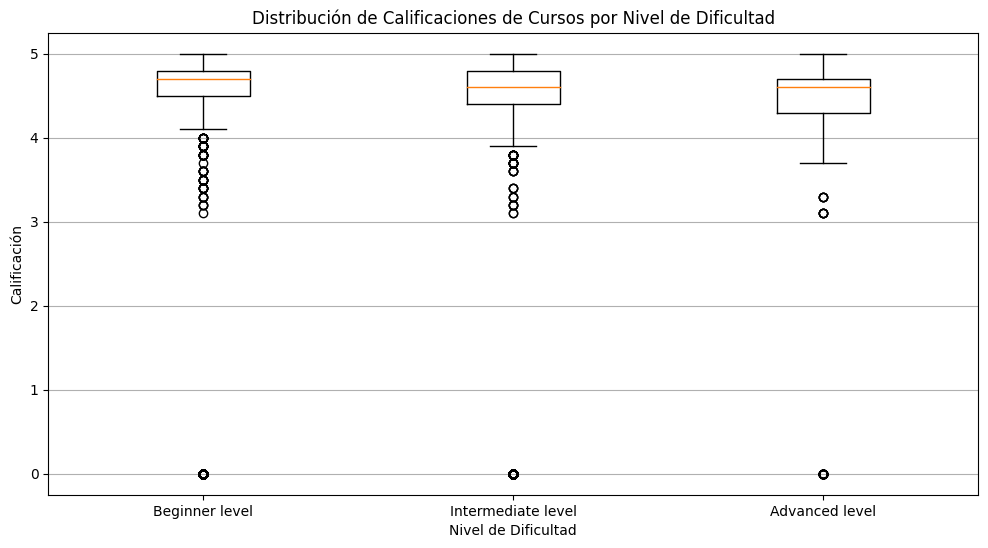

In [35]:
plt.figure(figsize=(12, 6))

# Agrupar por nivel de dificultad
levels = df_cleaned['Level'].unique()
data_to_plot = [df_cleaned[df_cleaned['Level'] == level]['Rating'] for level in levels]

# Crear el gráfico de cajas
plt.boxplot(data_to_plot, labels=levels)

# Añadir títulos y etiquetas
plt.title('Distribución de Calificaciones de Cursos por Nivel de Dificultad')
plt.xlabel('Nivel de Dificultad')
plt.ylabel('Calificación')

# Mostrar la gráfica
plt.grid(axis='y')  # Añadir líneas de cuadrícula en el eje y para mejor visualización
plt.show()

# Visualización de la frecuencia de palabras

Para graficar la frecuencia de palabras más comunes, se relizo un grafico de linea.

## Análisis

Para este grafico se ve como la palabra curso es la que más se repite y luego siguen las comillas.

Text(0, 0.5, 'Frecuencia')

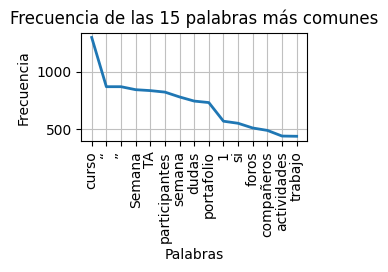

In [58]:
# Gráfico 1: Frecuencia de palabras
plt.subplot(3, 2, 1)
fdist.plot(15, cumulative=False)
plt.title('Frecuencia de las 15 palabras más comunes')
plt.xlabel('Palabras')
plt.ylabel('Frecuencia')

# Gráfico de pastel del análisis de sentimientos

Para representar los resultados de sentimientos de manera gráfica, se realizo un grafico de pastel en forma general.

## Análisis

Este gráfico se realizo en forma general mostrando un 100% para el comportamiento neutral.

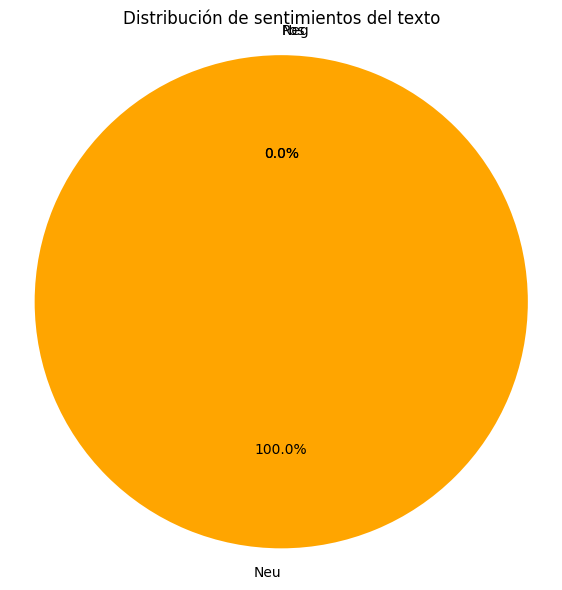

In [72]:
# Análisis de sentimientos general
labels = ['Neg', 'Neu', 'Pos']
sizes = [sentiment['neg'], sentiment['neu'], sentiment['pos']]
colors = ['red', 'orange', 'green']

plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.axis('equal')  # Para asegurar que el gráfico sea un círculo
plt.title('Distribución de sentimientos del texto')
plt.show()

# Distribución de la longitud de oraciones

Se realizo un histograma que muestre la distribución de la longitud de las oraciones tokenizadas.

## Análisis

En el gráfico se logra apreciar la frecuencia las oraciones en palabras que la mayoria tiene 10 palabras.

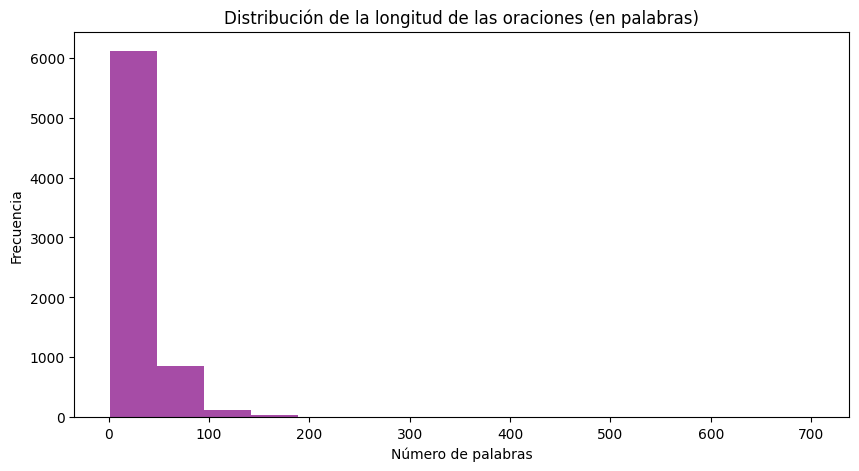

In [73]:
# Longitud de oraciones en número de palabras
sentence_lengths = [len(word_tokenize(sentence)) for sentence in tokens_oraciones]

plt.figure(figsize=(10, 5))
plt.hist(sentence_lengths, bins=15, color='purple', alpha=0.7)
plt.title('Distribución de la longitud de las oraciones (en palabras)')
plt.xlabel('Número de palabras')
plt.ylabel('Frecuencia')
plt.show()


# Comparación entre lematización y stemming

Para visualizar la diferencia entre el tamaño de palabras originales y las lematizadas o las palabras con stemming, se realizo un histograma.

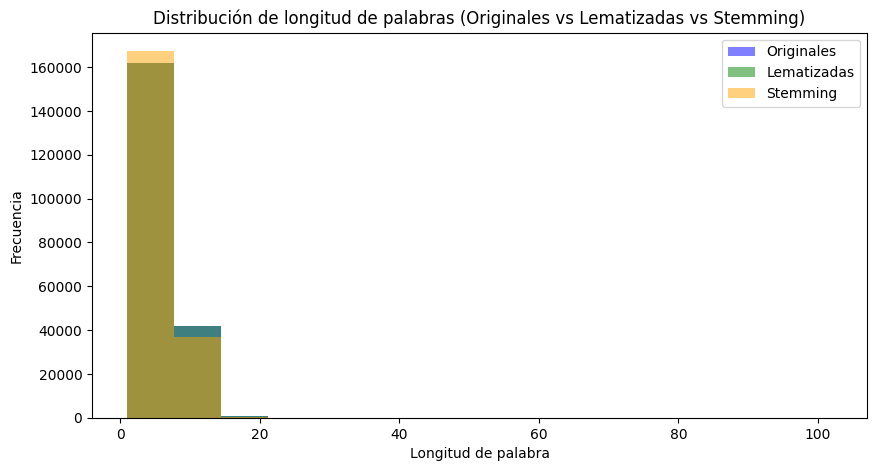

In [74]:
original_lengths = [len(token) for token in tokens_palabras]
lemmatized_lengths = [len(token) for token in lematized_words]
stemmed_lengths = [len(token) for token in stemmed_words]

plt.figure(figsize=(10, 5))
plt.hist(original_lengths, bins=15, alpha=0.5, label='Originales', color='blue')
plt.hist(lemmatized_lengths, bins=15, alpha=0.5, label='Lematizadas', color='green')
plt.hist(stemmed_lengths, bins=15, alpha=0.5, label='Stemming', color='orange')
plt.title('Distribución de longitud de palabras (Originales vs Lematizadas vs Stemming)')
plt.xlabel('Longitud de palabra')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()


# Gráfico de entidades nombradas

Se hizo un gráfico que muestra cuántas entidades nombradas se detectaron:

## Análisis

Las entidades más frecuentes fueron:
- PERSON
- ORGANIZATION
- GPE

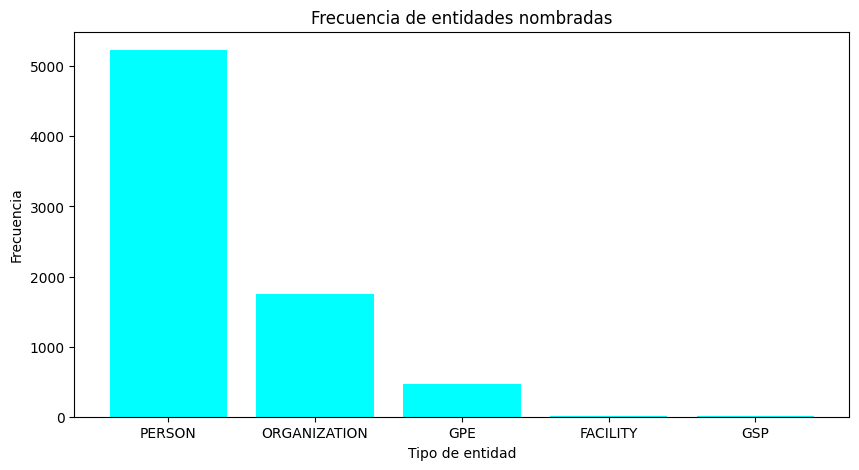

In [75]:
# Contar la frecuencia de las entidades nombradas
entities = [chunk for chunk in named_entities if hasattr(chunk, 'label')]
entity_labels = [chunk.label() for chunk in entities]
fdist_entities = FreqDist(entity_labels)

# Graficar la frecuencia de entidades
entity_names, entity_counts = zip(*fdist_entities.most_common())

plt.figure(figsize=(10, 5))
plt.bar(entity_names, entity_counts, color='cyan')
plt.title('Frecuencia de entidades nombradas')
plt.xlabel('Tipo de entidad')
plt.ylabel('Frecuencia')
plt.show()


# Conclusión General
El proceso de análisis de datos y procesamiento de texto que hemos seguido es una parte fundamental en la ciencia de datos y en la toma de decisiones basada en la información. A través de herramientas poderosas como Pandas, NumPy, Matplotlib, y NLTK, hemos cubierto varias etapas clave que son esenciales en cualquier proyecto de análisis:

1. Limpieza y Transformación de Datos con Pandas y NumPy:

- La limpieza de datos es una de las fases más críticas, ya que los datos "sucios" pueden distorsionar el análisis y llevar a conclusiones erróneas.
- Utilizamos Pandas para manejar estructuras de datos tabulares, transformando y limpiando datos como la eliminación de caracteres no deseados y la conversión de tipos de datos.
- NumPy complementa esta etapa al proporcionar herramientas para realizar cálculos eficientes y manipulaciones de arrays numéricos, lo que es útil para cálculos estadísticos y manejo de grandes cantidades de datos.

2. Análisis de Datos y Generación de Informes:

- Luego de la limpieza, aplicamos técnicas de agregación y análisis para generar estadísticas útiles (como el promedio de ratings por curso, identificación de los cursos con mayor y menor calificación, y el cálculo de porcentajes sobre cursos con horarios flexibles).
- Estos análisis ayudan a identificar patrones clave, permitiendo a los tomadores de decisiones comprender mejor los datos y actuar en consecuencia.

3. Procesamiento de Lenguaje Natural (PLN) con NLTK:

- Para el análisis de texto, NLTK es una herramienta esencial. Permite realizar tareas como tokenización, lematización, eliminación de palabras vacías (stopwords) y análisis de entidades.
- Estas técnicas nos permiten descomponer, analizar y entender grandes volúmenes de texto, transformando datos no estructurados (como texto en archivos .txt) en información útil para el análisis.
- El análisis de sentimientos y el reconocimiento de entidades nombradas proporcionan un entendimiento más profundo del texto, que puede ser crucial para aplicaciones como el análisis de opiniones, evaluaciones de contenido o clasificación automática de textos.

4. Visualización (futuro):

- Aunque no la abordamos en este paso, las visualizaciones serán fundamentales para presentar los datos de manera clara e informativa. Herramientas como Matplotlib permiten crear gráficos que resumen datos numéricos y categóricos de forma visual, ayudando a comunicar patrones y hallazgos de manera efectiva.